# Setup

In [1]:
import librosa
import time
import numpy as np
import tensorflow as tf
import IPython
import IPython.display as ipd 
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from keras.optimizers import Adam

%matplotlib inline
matplotlib.style.use('ggplot')

Using TensorFlow backend.


In [2]:
from audioGan import *
from ganSetup import *
from ganModels import *

In [3]:
USE_GPU = True

if USE_GPU:
    device = '/device:GPU:0'
else:
    device = '/cpu:0'
    
print('Using device: ', device)

Using device:  /device:GPU:0


# Freesound Database

In [4]:
train = pd.read_csv(DATASET_PATH + "train.csv")
test  = pd.read_csv(DATASET_PATH + "sample_submission.csv")
print(train.label.unique())

['Hi-hat' 'Saxophone' 'Trumpet' 'Glockenspiel' 'Cello' 'Knock'
 'Gunshot_or_gunfire' 'Clarinet' 'Computer_keyboard' 'Keys_jangling'
 'Snare_drum' 'Writing' 'Laughter' 'Tearing' 'Fart' 'Oboe' 'Flute' 'Cough'
 'Telephone' 'Bark' 'Chime' 'Bass_drum' 'Bus' 'Squeak' 'Scissors'
 'Harmonica' 'Gong' 'Microwave_oven' 'Burping_or_eructation' 'Double_bass'
 'Shatter' 'Fireworks' 'Tambourine' 'Cowbell' 'Electric_piano' 'Meow'
 'Drawer_open_or_close' 'Applause' 'Acoustic_guitar' 'Violin_or_fiddle'
 'Finger_snapping']


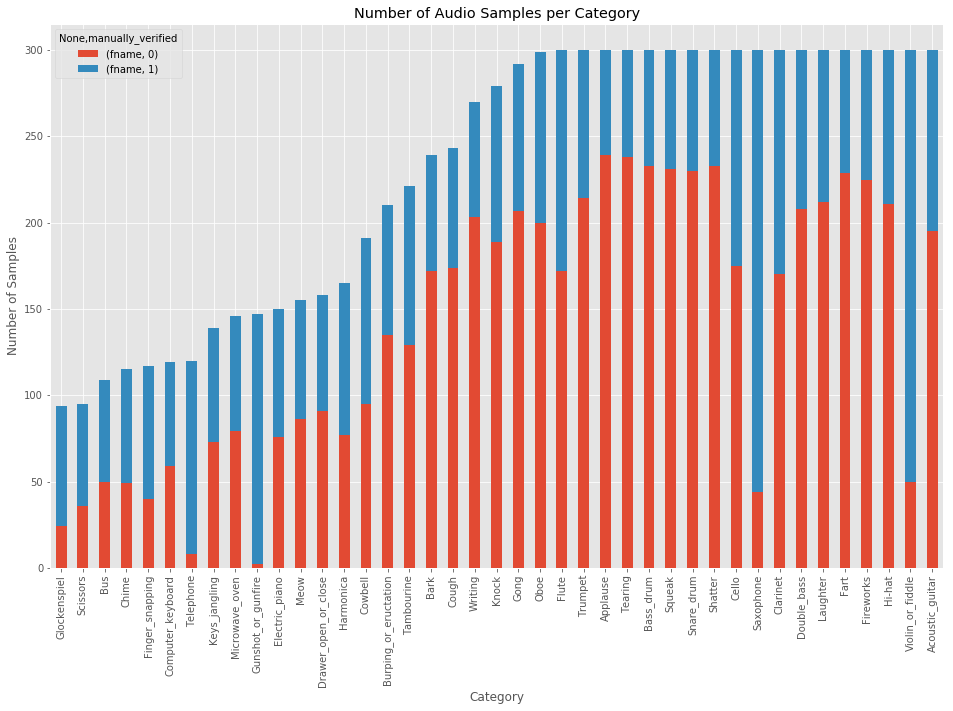

In [5]:
category_group = train.groupby(['label', 'manually_verified']).count()
plot = category_group.unstack().reindex(category_group.unstack().sum(axis=1).sort_values().index)\
          .plot(kind='bar', stacked=True, title="Number of Audio Samples per Category", figsize=(16,10))
plot.set_xlabel("Category")
plot.set_ylabel("Number of Samples");

Total samples (frames) =  (224000,)
[ 1.6797570e-04 -2.0134998e-05 -7.2674861e-04 ... -4.2972777e-05
 -4.2764965e-05  7.4707823e-06]


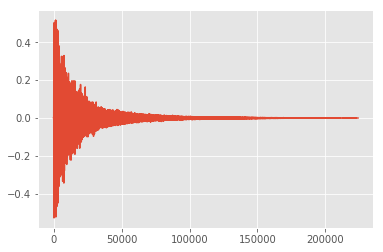

In [6]:
fname = "../../Datasets/freesound-audio-tagging/audio_train/" + "00044347.wav"   # Hi-hat
data, _ = librosa.core.load(fname, sr=SAMPLE_RATE, res_type='kaiser_fast')
print("Total samples (frames) = ", data.shape)
print(data)
IPython.display.display(ipd.Audio(filename=fname))
plt.plot(data, '-', )
plt.show()

Shape:  (40, 63)


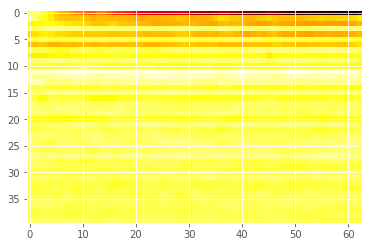

In [7]:
data = data[:2*SAMPLE_RATE]
mfcc = librosa.feature.mfcc(data, sr = SAMPLE_RATE, n_mfcc=40)
print("Shape: ", mfcc.shape)
plt.imshow(mfcc, cmap='hot', interpolation='nearest');

# GAN Architecture

### Discriminator

In [8]:
d = discriminator(AUDIO_SHAPE)
d.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_1 (Reshape)          (None, 64000, 1)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 9142, 32)          384       
_________________________________________________________________
activation_1 (Activation)    (None, 9142, 32)          0         
_________________________________________________________________
average_pooling1d_1 (Average (None, 2285, 32)          0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 2285, 32)          128       
_________________________________________________________________
dropout_1 (Dropout)          (None, 2285, 32)          0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 456, 16)           3600      
__________

### Generator

In [9]:
g = generator(NOISE_DIM, AUDIO_SHAPE)
g.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 1000)              501000    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 1000)              0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 1000)              4000      
_________________________________________________________________
reshape_2 (Reshape)          (None, 1000, 1)           0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1000, 16)          816       
_________________________________________________________________
re_lu_1 (ReLU)               (None, 1000, 16)          0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 1000, 16)          64        
__________

### Stacked Generator and Discriminator

In [10]:
s = stacked_G_D(g,d)
s.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 64000)             595000    
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 1247993   
Total params: 1,842,993
Trainable params: 1,838,609
Non-trainable params: 4,384
_________________________________________________________________


### Autoencoder

In [11]:
e = encoder(AUDIO_SHAPE, ENCODE_SIZE)
a = autoEncoder(e, g)
a.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_4 (Sequential)    (None, 500)               1221016   
_________________________________________________________________
sequential_2 (Sequential)    (None, 64000)             595000    
Total params: 1,816,016
Trainable params: 1,813,688
Non-trainable params: 2,328
_________________________________________________________________


# Audio GAN 

In [12]:
myGan = AudioGAN(label = LABEL)

Data Loaded...
Data Normalized...


### Running Autoencoder

In [13]:
start = time.time()
myGan.train_autoencoder(epochs = 100, save_internal = 10, batch = 16)
end = time.time()
total = round(end - start, 2)
print("\nExecution Time: ", total, "s")

Epoch:  0 , Loss:  [2.3003144, 0.0]
Epoch:  10 , Loss:  [1.5583105, 0.0]
Epoch:  20 , Loss:  [1.1267192, 0.0]
Epoch:  30 , Loss:  [0.65607274, 0.0]
Epoch:  40 , Loss:  [1.4315293, 0.0]
Epoch:  50 , Loss:  [1.2865653, 0.0]
Epoch:  60 , Loss:  [0.7595163, 0.0]
Epoch:  70 , Loss:  [1.9579887, 0.0]
Epoch:  80 , Loss:  [0.54654425, 0.0]
Epoch:  90 , Loss:  [0.8629892, 0.0]

Execution Time:  72.42 s


Original:


Result:


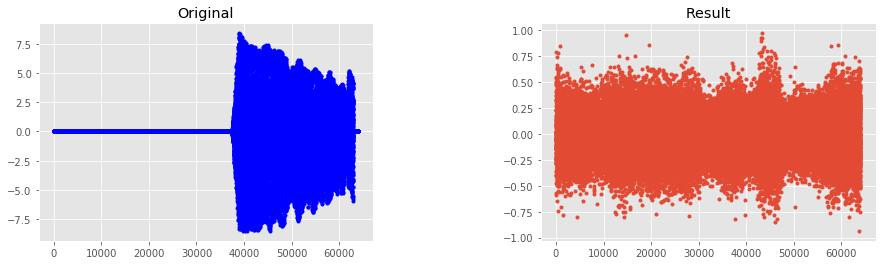

In [14]:
INDEX = 56
sample = myGan.trainData[INDEX]

print("Original:")
IPython.display.display(ipd.Audio(data = sample, rate = SAMPLE_RATE))
librosa.output.write_wav(AUTO_ENCODER_PATH + "AE_Original_" + LABEL + ".wav", 
                         y = sample, sr = SAMPLE_RATE , norm = True)
result = myGan.autoencoder.predict(sample.reshape((1,AUDIO_SHAPE))).flatten()

print("Result:")
IPython.display.display(ipd.Audio(data = result, rate = SAMPLE_RATE))
librosa.output.write_wav(AUTO_ENCODER_PATH + "AE_Result_" + LABEL + ".wav", 
                         y = result, sr = SAMPLE_RATE , norm = True)

fig      = plt.figure(figsize=(1, 2))
Original = fig.add_subplot(1, 2, 1)
Result   = fig.add_subplot(1, 2, 2)

Original.set_title('Original')
Result.set_title('Result')

Original.plot(sample, '.', color ='blue')
Result.plot(result, '.', )


plt.gcf().set_size_inches(15, 4)
plt.subplots_adjust(wspace=0.5,hspace=0.3)
plt.show()

ori_ext  = Original.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
res_ext  = Result.get_window_extent().transformed(fig.dpi_scale_trans.inverted())

fig.savefig(PICTURE_PATH + "AE_Original_" + LABEL + ".png", bbox_inches = ori_ext.expanded(1.2, 1.2))
fig.savefig(PICTURE_PATH + "AE_Result_" + LABEL + ".png", bbox_inches = res_ext.expanded(1.2, 1.2))

### Running GAN

epoch: 0
Discriminator_loss: 0.704746, Generator_loss: 0.734206


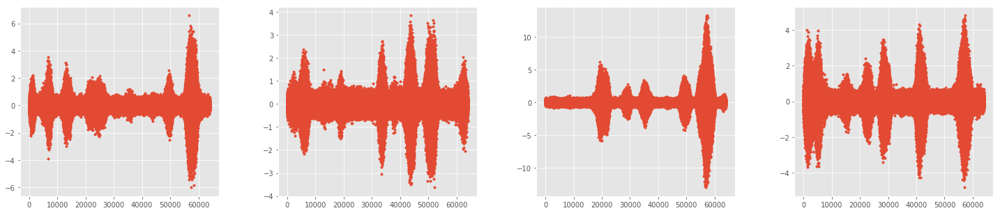

epoch: 5
Discriminator_loss: 0.773065, Generator_loss: 0.872534
epoch: 10
Discriminator_loss: 0.656831, Generator_loss: 0.770992


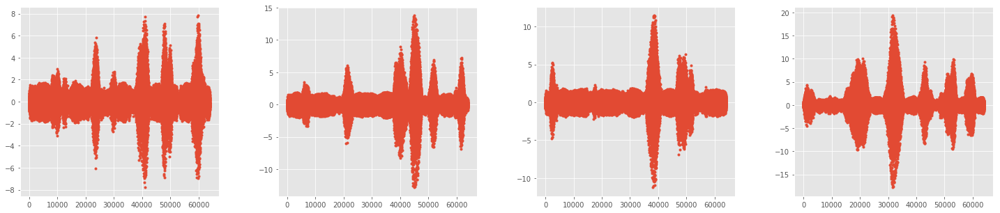

epoch: 15
Discriminator_loss: 0.665284, Generator_loss: 0.808502
epoch: 20
Discriminator_loss: 0.575920, Generator_loss: 0.725725


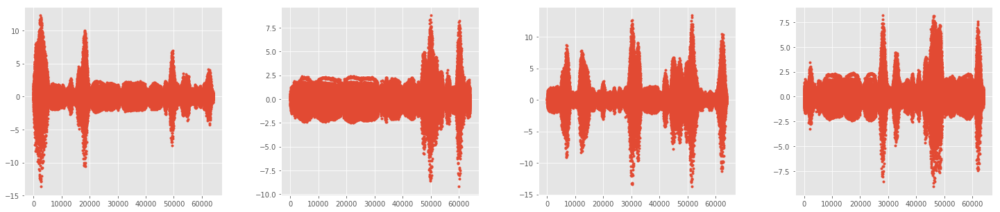

epoch: 25
Discriminator_loss: 0.577132, Generator_loss: 0.785209
epoch: 30
Discriminator_loss: 0.513799, Generator_loss: 0.760608


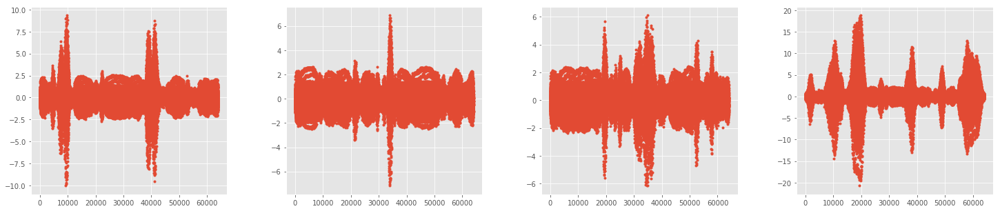

epoch: 35
Discriminator_loss: 0.542710, Generator_loss: 0.650663
epoch: 40
Discriminator_loss: 0.539502, Generator_loss: 0.662322


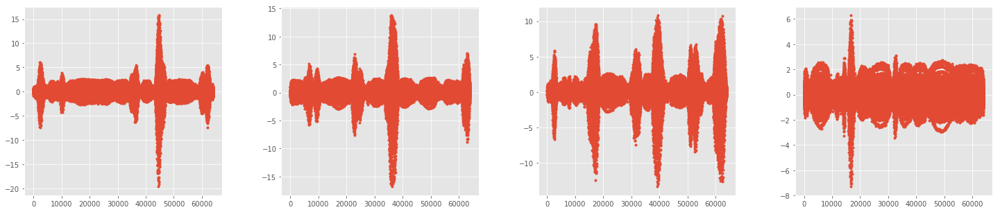

epoch: 45
Discriminator_loss: 0.601683, Generator_loss: 0.740437
epoch: 50
Discriminator_loss: 0.524825, Generator_loss: 0.632812


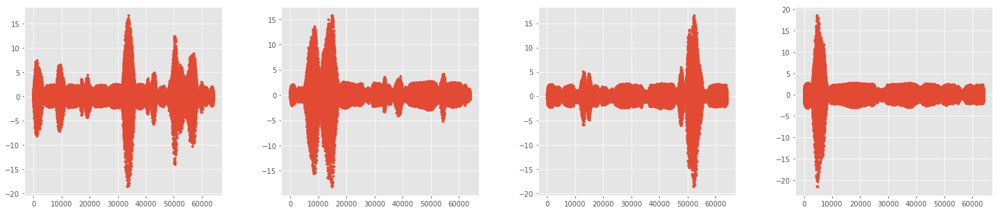

epoch: 55
Discriminator_loss: 0.508335, Generator_loss: 0.711735
epoch: 60
Discriminator_loss: 0.541306, Generator_loss: 0.696926


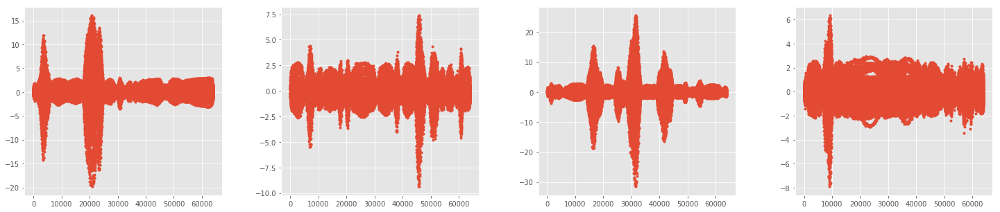

epoch: 65
Discriminator_loss: 0.516231, Generator_loss: 0.713074
epoch: 70
Discriminator_loss: 0.523882, Generator_loss: 0.683822


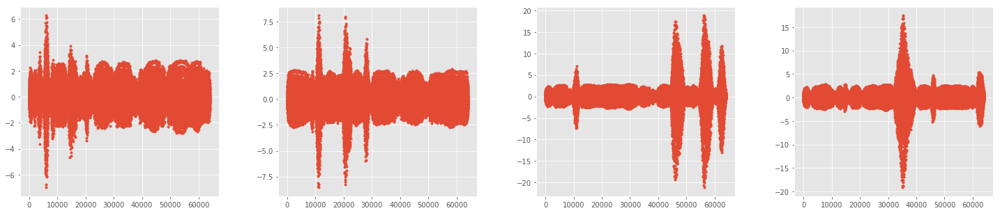

epoch: 75
Discriminator_loss: 0.532873, Generator_loss: 0.717293
epoch: 80
Discriminator_loss: 0.511573, Generator_loss: 0.659392


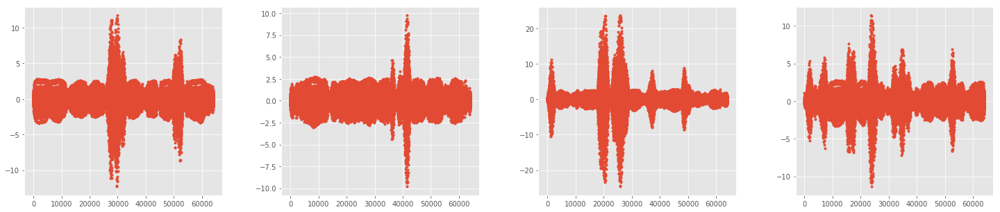

epoch: 85
Discriminator_loss: 0.511617, Generator_loss: 0.647379
epoch: 90
Discriminator_loss: 0.519800, Generator_loss: 0.718843


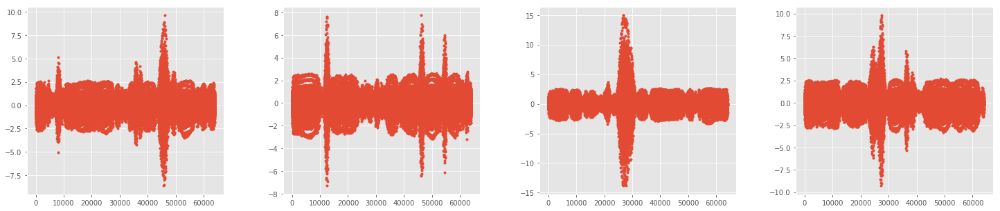

epoch: 95
Discriminator_loss: 0.510248, Generator_loss: 0.652365
Execution Time:  106.27 s


In [15]:
start = time.time()
myGan.train_gan(epochs = 100, batch = 16, save_interval = 10)
end = time.time()
total = round(end - start, 2)
print("Execution Time: ", total, "s")

### Discriminator and Generator Loss over Epochs

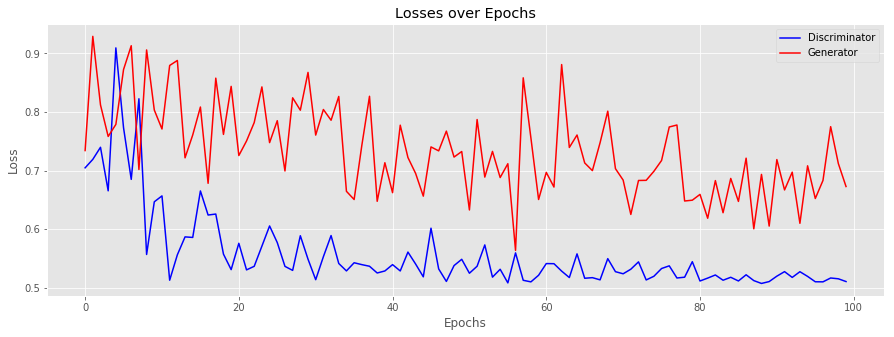

In [16]:
plt.title('Losses over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.plot(myGan.disLossHist, '-', label = 'Discriminator', color = 'blue')
plt.plot(myGan.genLossHist, '-', label = 'Generator',     color = 'red')
plt.legend(loc = 'best')

plt.gcf().set_size_inches(15, 5)
plt.savefig(PICTURE_PATH + "D_G_Loss.png", bbox_inches='tight')
plt.show()

### Test Sample

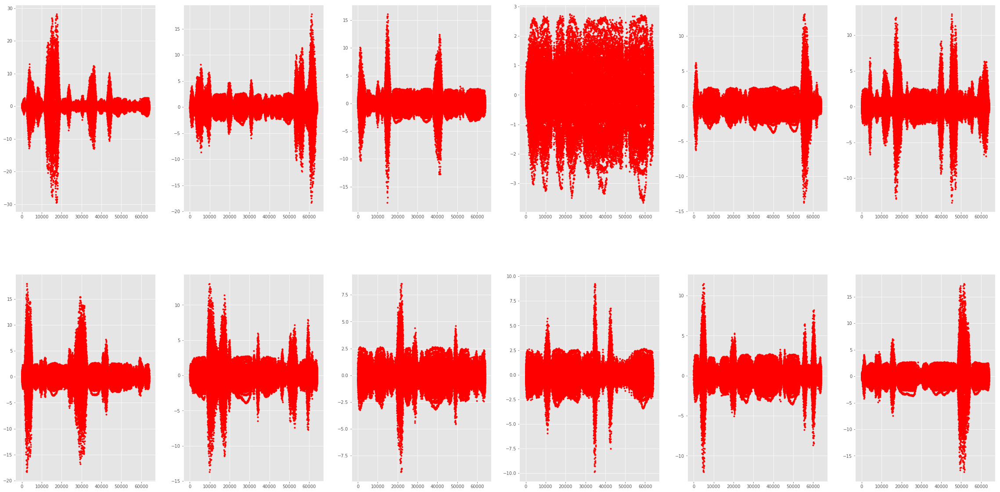

In [17]:
lin, col = 2, 6
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))
        
        
for i in range(lin):
    for j in range(col):
        gen_noise = np.random.normal(0, 1, (1,NOISE_DIM))
        gen_test = myGan.gen.predict(gen_noise).flatten()
        #IPython.display.display(ipd.Audio(data=gen_test, rate=SAMPLE_RATE))
        subPlotS[(i*col)+j].plot(gen_test, '.', color='red')



plt.gcf().set_size_inches(40, 20)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "Generated_"+ LABEL + ".png", bbox_inches='tight')

### Original Samples

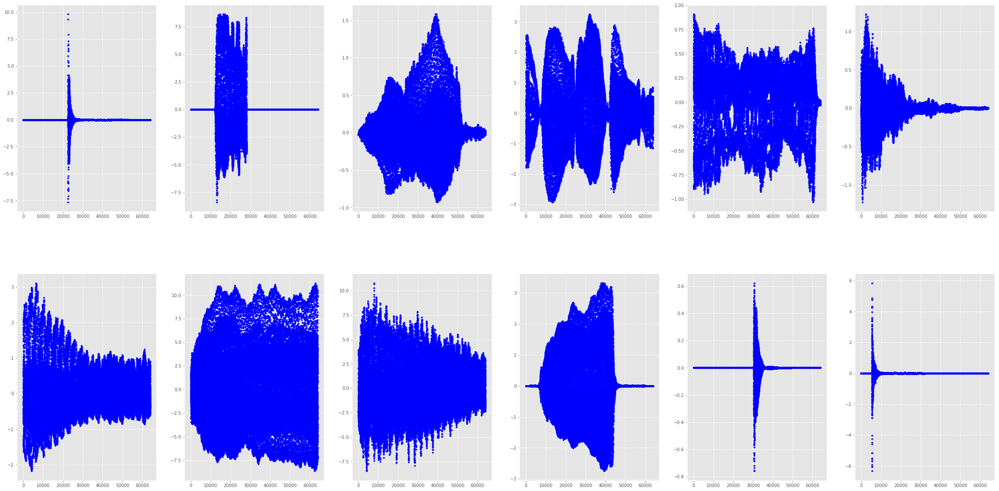

In [18]:
lin, col = 2, 6
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))
        
        
for i in range(lin):
    for j in range(col):
        random_index = np.random.randint(0, len(myGan.trainData))
        original = myGan.trainData[random_index]
        #IPython.display.display(ipd.Audio(data=original, rate=SAMPLE_RATE))
        subPlotS[(i*col)+j].plot(original, '.', color='blue')

plt.gcf().set_size_inches(40, 20)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "Originals_"+ LABEL + ".png", bbox_inches='tight')